In [1]:

import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp
from genpen.utils import Paper
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
import vpype
from skimage import io
from pathlib import Path

from sklearn.preprocessing import minmax_scale
from skimage import feature
from skimage import exposure

from skimage import filters
from skimage.color import rgb2gray
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.morphology import disk

def local_angle(dx, dy):
    """Calculate the angles between horizontal and vertical operators."""
    return np.mod(np.arctan2(dy, dx), np.pi)

from PIL import Image


import cv2




In [87]:
image_path= '/home/naka/art/youknowhowifeel.png'
filename = 'charb3.svg'
paper_size:str = '19x24 inches'
border:float=40  # mm
image_rescale_factor:float=0.08
smooth_disk_size:int=0
hist_clip_limit=0.1
hist_nbins=32
intensity_min=0.
intensity_max=1.
hatch_spacing_min=0.6  # mm
hatch_spacing_max=1.5 # mm
pixel_width=1 # mm
pixel_height=1 # mm
angle_jitter='0'  # degrees
pixel_rotation='0'  # degrees
merge_tolerances=[0.5, 0.8, 1.2]  # mm
simplify_tolerances=[0.2, 0.4]  # mm
savedir='/home/naka/art/plotter_svgs'

In [77]:
# make page
paper = Paper(paper_size)
drawbox = paper.get_drawbox(border)

# load
img =  io.imread(Path(image_path))

In [78]:
image = Image.open(Path(image_path))
cmyk_image = np.array(image.convert('CMYK'))[:, :, :3]
    

In [79]:
img_rescale = rescale(cmyk_image, image_rescale_factor, multichannel=True)
        
# 
# img_renorm = exposure.equalize_adapthist(img_rescale, clip_limit=hist_clip_limit, nbins=hist_nbins)
img_renorm = img_rescale

In [80]:
# calc dominant angle
selem = disk(smooth_disk_size)
filt_img = np.stack([filters.rank.mean(img_renorm[:,:,ii], selem) for ii in range(img_renorm.shape[2])], axis=2)

<ipython-input-80-65a912c096f2>:3: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  filt_img = np.stack([filters.rank.mean(img_renorm[:,:,ii], selem) for ii in range(img_renorm.shape[2])], axis=2)


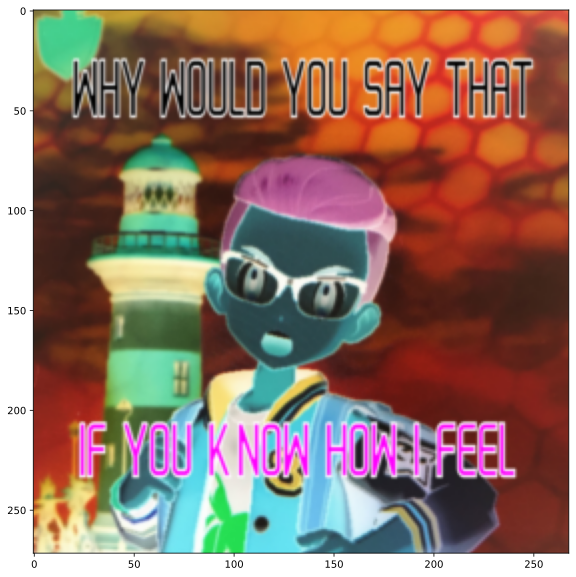

In [81]:
f,ax = plt.subplots(figsize=(10,10))
ax.imshow(filt_img)

In [82]:
angle_farid = np.stack([local_angle(filters.farid_h(filt_img[:, :, ii]), filters.farid_v(filt_img[:, :, ii])) for ii in range(img_renorm.shape[2])], axis=2)

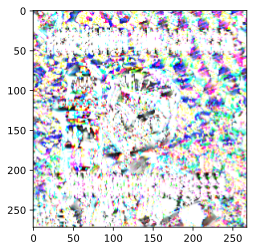

In [83]:
plt.imshow(angle_farid)

In [84]:
rhps = []
for ii in range(img_renorm.shape[2]):
    # make pixel polys
    prms = []
    for y, row in tqdm(enumerate(img_renorm[:,:, ii])):
        for x, intensity in enumerate(row):

            p = gp.centered_box(Point(x, y), width=pixel_width, height=pixel_height)
            a = np.degrees(angle_farid[y, x, ii])
            prm = {
                'geometry':p,
                'x':x,
                'y':y,
                'raw_pixel_width':pixel_width,
                'raw_pixel_height':pixel_height,
                'intensity': intensity,
                'angle':a,
                'group': 'raw_hatch_pixel',

            }
            prms.append(prm)
    raw_hatch_pixels = geopandas.GeoDataFrame(prms)
    rhps.append(raw_hatch_pixels)

272it [00:02, 98.13it/s] 
272it [00:02, 101.78it/s]
272it [00:03, 84.56it/s] 


In [85]:
fill_sets = []
for raw_hatch_pixels in rhps:
    #  rescale polys to fit in drawbox
    bbox = box(*raw_hatch_pixels.total_bounds)
    _, transform = gp.make_like(bbox, drawbox, return_transform=True)
    A = gp.AffineMatrix(**transform)
    scaled_hatch_pixels = raw_hatch_pixels.copy()
    scaled_hatch_pixels['geometry'] = scaled_hatch_pixels.affine_transform(A.A_flat)
    scaled_hatch_pixels['scaled_pixel_height'] = scaled_hatch_pixels['geometry'].apply(gp.get_height)
    scaled_hatch_pixels['scaled_pixel_width'] = scaled_hatch_pixels['geometry'].apply(gp.get_width)

    # distributions etc
    angle_jitter_gen = gp.make_callable(eval(angle_jitter))
    pixel_rotation_gen = gp.make_callable(eval(pixel_rotation))


    scaled_hatch_pixels['angle_jitter'] = angle_jitter_gen(len(scaled_hatch_pixels))
    scaled_hatch_pixels['hatch_angle'] = scaled_hatch_pixels['angle'] + scaled_hatch_pixels['angle_jitter']
    scaled_hatch_pixels['pixel_rotation'] = pixel_rotation_gen(len(scaled_hatch_pixels))

    example_height = scaled_hatch_pixels.loc[0, 'scaled_pixel_height']
    example_width = scaled_hatch_pixels.loc[0, 'scaled_pixel_width']
    print(f'pixel size = {example_width:.2}x{example_height:.2}mm')

    spacing_func = functools.partial(np.interp, xp=[intensity_min, intensity_max], fp=[hatch_spacing_max, hatch_spacing_min, ])
    scaled_hatch_pixels['spacing'] = spacing_func(1 - scaled_hatch_pixels['intensity'])
    new_rows = []
    for i, row in tqdm(scaled_hatch_pixels.iterrows(), total=len(scaled_hatch_pixels)):
        r = row.copy()

        p = r['geometry']
        if abs(r['pixel_rotation']) > np.finfo(float).eps:
            p = sa.rotate(p, r['pixel_rotation'])
        f = gp.hatchbox(p, spacing=r['spacing'], angle=r['hatch_angle'])
        r['geometry'] = f
        new_rows.append(r)

    fills = geopandas.GeoDataFrame(new_rows)
    fills = fills[fills.length > 0.05]
    fill_layer = gp.merge_LineStrings(fills.geometry)
    fill_sets.append(fill_layer)

  0%|          | 0/72896 [00:00<?, ?it/s]

pixel size = 1.5x1.5mm


  0%|          | 0/72896 [00:00<?, ?it/s]

pixel size = 1.5x1.5mm


  0%|          | 0/72896 [00:00<?, ?it/s]

pixel size = 1.5x1.5mm


100%|██████████| 72896/72896 [00:23<00:00, 3135.46it/s]


In [86]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
for ii, fill_layer in enumerate(fill_sets):
    sk.stroke(ii+1)
    sk.geometry(fill_layer)

In [39]:
sk.display()

KeyboardInterrupt: 

In [88]:
sk.vpype('linesort')
        
for tolerance in merge_tolerances:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')

for tolerance in simplify_tolerances:
    sk.vpype(f'linesimplify --tolerance {tolerance}mm')

sk.vpype('linesort')
# sk.display()

In [89]:
savepath = Path(savedir).joinpath(filename).as_posix()
sk.save(savepath)

## but wiggly

In [61]:
image_path= '/home/naka/art/wigglesphere2.jpg'
filename = 'wigglesphere2.svg'
paper_size:str = '200x200 mm'
border:float=15  # mm
image_rescale_factor:float=0.02
smooth_disk_size:int=0
hist_clip_limit=0.1
hist_nbins=32
intensity_min=0.
intensity_max=1.
hatch_spacing_min=0.35  # mm
hatch_spacing_max=1.1 # mm
pixel_width=1 # mm
pixel_height=1 # mm
angle_jitter='ss.norm(loc=10, scale=5).rvs'  # degrees
pixel_rotation='0'  # degrees
merge_tolerances=[0.3, 0.4,]  # mm
simplify_tolerances=[0.2,]  # mm
savedir='/home/naka/art/plotter_svgs'

In [47]:
# make page
paper = Paper(paper_size)
drawbox = paper.get_drawbox(border)

# load
img =  rgb2gray(io.imread(Path(image_path)))

In [48]:

        
img_rescale = rescale(img, image_rescale_factor)
img_renorm = exposure.equalize_adapthist(img_rescale, clip_limit=hist_clip_limit, nbins=hist_nbins)
# img_renorm = img_rescale

In [49]:
# calc dominant angle
selem = disk(smooth_disk_size)
filt_img = filters.rank.mean(img_renorm, selem)
angle_farid = local_angle(filters.farid_h(filt_img), filters.farid_v(filt_img))

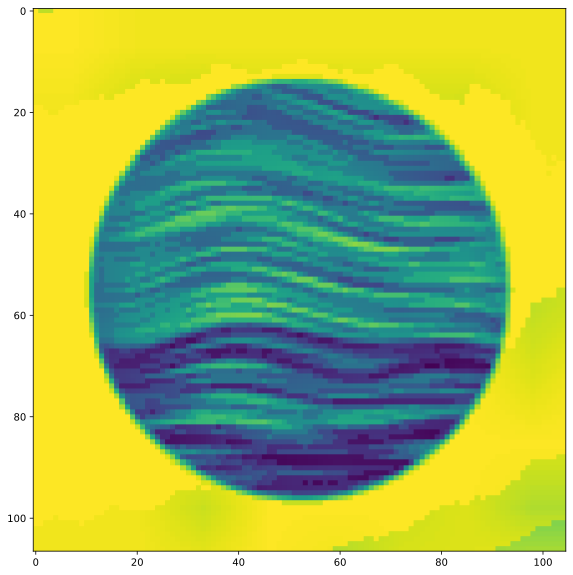

In [50]:
f,ax = plt.subplots(figsize=(10,10))
ax.imshow(filt_img)

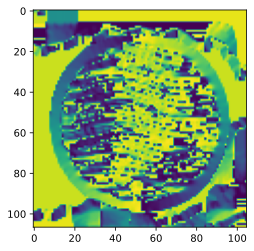

In [51]:
plt.imshow(angle_farid)

In [52]:
# make pixel polys
prms = []
for y, row in tqdm(enumerate(img_renorm)):
    for x, intensity in enumerate(row):

        p = gp.centered_box(Point(x, y), width=pixel_width, height=pixel_height)
        a = np.degrees(angle_farid[y, x])
        prm = {
            'geometry':p,
            'x':x,
            'y':y,
            'raw_pixel_width':pixel_width,
            'raw_pixel_height':pixel_height,
            'intensity': intensity,
            'angle':a,
            'group': 'raw_hatch_pixel',

        }
        prms.append(prm)
raw_hatch_pixels = geopandas.GeoDataFrame(prms)

#  rescale polys to fit in drawbox
bbox = box(*raw_hatch_pixels.total_bounds)
_, transform = gp.make_like(bbox, drawbox, return_transform=True)
A = gp.AffineMatrix(**transform)
scaled_hatch_pixels = raw_hatch_pixels.copy()
scaled_hatch_pixels['geometry'] = scaled_hatch_pixels.affine_transform(A.A_flat)
scaled_hatch_pixels['scaled_pixel_height'] = scaled_hatch_pixels['geometry'].apply(gp.get_height)
scaled_hatch_pixels['scaled_pixel_width'] = scaled_hatch_pixels['geometry'].apply(gp.get_width)

107it [00:00, 252.31it/s]


In [53]:
# distributions etc
angle_jitter_gen = gp.make_callable(eval(angle_jitter))
pixel_rotation_gen = gp.make_callable(eval(pixel_rotation))


scaled_hatch_pixels['angle_jitter'] = angle_jitter_gen(len(scaled_hatch_pixels))
scaled_hatch_pixels['hatch_angle'] = scaled_hatch_pixels['angle'] + scaled_hatch_pixels['angle_jitter']
scaled_hatch_pixels['pixel_rotation'] = pixel_rotation_gen(len(scaled_hatch_pixels))

example_height = scaled_hatch_pixels.loc[0, 'scaled_pixel_height']
example_width = scaled_hatch_pixels.loc[0, 'scaled_pixel_width']
print(f'pixel size = {example_width:.2}x{example_height:.2}mm')

pixel size = 1.6x1.6mm


In [54]:
spacing_func = functools.partial(np.interp, xp=[intensity_min, intensity_max], fp=[hatch_spacing_max, hatch_spacing_min, ])
scaled_hatch_pixels['spacing'] = spacing_func(1 - scaled_hatch_pixels['intensity'])
xjf = ss.norm(loc=0, scale=0.0).rvs
yjf = ss.norm(loc=0, scale=0.2).rvs
new_rows = []
for i, row in tqdm(scaled_hatch_pixels.iterrows(), total=len(scaled_hatch_pixels)):
    r = row.copy()

    p = r['geometry']
    if abs(r['pixel_rotation']) > np.finfo(float).eps:
        p = sa.rotate(p, r['pixel_rotation'])
#     f = gp.hatchbox(p, spacing=r['spacing'], angle=r['hatch_angle'])
    f = gp.BezierHatchFill(
        p, xjitter_func=xjf, 
        yjitter_func=yjf, spacing=r['spacing'], 
        degrees=r['hatch_angle'], n_nodes_per_line=7, n_eval_points=30)
    r['geometry'] = f.fill
    new_rows.append(r)

100%|██████████| 11235/11235 [00:16<00:00, 673.70it/s]


In [59]:
fills = geopandas.GeoDataFrame(new_rows)
fills = fills[fills.length > 0]
fill_layer = gp.merge_LineStrings(fills.geometry)

sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.stroke(1)
sk.geometry(fill_layer)

In [60]:
sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-15T12:09:13.758412 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="350.9309,83.7222 351.1236,83.7333 351.4194,83.7478 351.7151,83.7574 352.0109,83.7602 352.3066,83.7542 352.6024,83.7379 352.8982,83.7102 353.1939,83.6708 353.4897,83.619

In [62]:
sk.vpype('splitall')
        
    
for tolerance in tqdm(merge_tolerances):
    sk.vpype(f'linemerge --tolerance {tolerance}mm')

for tolerance in tqdm(simplify_tolerances):
    sk.vpype(f'linesimplify --tolerance {tolerance}mm')

sk.vpype('linesort')
sk.display()

100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-05-15T12:10:06.000023 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="435.4829,442.8405 434.9989,444.6226 432.6925,445.3931 428.994,444.0143 421.7725,445.821 417.0963,448.4456 413.2901,447.3676 406.4584,449.1386 394.5891,448.105 393.2175,447.0086 389.075,447.6952 387.0051,446.4175 380.9552,446.518 370.6441,442.7874 368.6496,441.0038 373.5497,439.8313 374.9503,440.7366 380.5562,440.4379 380.9552,441.3687 374.1772,441.0038 376.6256,443.9041 383.5604,444.3964 392.9649,442.3393 395.5948,443.4929 403.9211,443.5534 404.9746,442.1525 412.681,441.8406 416.9843,443.1887 419.3583,441.8373"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="410.9795,557.0963 419.4262,560.875 421.1706,567.1057 420.1995,567.845 421.4285,574.4667 422.9892,577.6161 428.5554,572.8516 431.0088,572.5445 434.9599,568.1331 434.9989,566.4567 426.4168,561.1009 417.8631,558.7095 416.9843,556.9488 412.8388,555.2534 410.9795,555.4827 410.9795,553.8283 405.6744,554.6242 409.785,556.0907 410.9795,559.3103 416.43,560.7191 415.8014,566.8747 418.1035,573.1106 417.0531,576.5964 404.1677,567.3445 402.5745,562.277 398.9698,557.7812 398.9698,558.9591 397.5935,555.2198 392.9649,552.6375 392.5947,553.4102 389.5476,550.6052 386.8273,543.0863 386.5915,545.2256 383.3195,549.0912 386.6501,550.6819 390.9025,555.096 392.9649,559.499"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="344.926,566.4348 356.9358,570.4019 362.9406,568.714 368.9455,569.2026 368.9455,567.9621 374.9503,566.5147 366.4661,563.4001 356.9358,564.6249 346.1772,562.1386 327.074,562.6889 326.9115,561.5807 323.8519,561.4774 314.9573,562.5302 308.8969,565.7324 308.8969,564.4714 303.5456,566.7757 303.386

In [63]:
savepath = Path(savedir).joinpath(filename).as_posix()
sk.save(savepath)